# Atividade 01 - Unidade 02 - Suavização, Remoção de Ruído e Detecção de Bordas

---

### Etapas:
1. Seleção das Imagens
2. Aplicação de Filtros de Suavização
3. Detecção de Bordas (sem suavização prévia)
4. Detecção de Bordas após Suavização
5. Conclusão

# 0 - Imports e Configurações Globais

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
# Caminhos do dataset
BASE = "dataset"
CLASSE_A = os.path.join(BASE, "classe_dualsense")
CLASSE_B = os.path.join(BASE, "classe_mouse")

SCALE = 0.15

print("Ambiente configurado.")
print(f"Pasta Classe A (DualSense): {CLASSE_A}")
print(f"Pasta Classe B (Mouse):     {CLASSE_B}")

Ambiente configurado.
Pasta Classe A (DualSense): dataset\classe_dualsense
Pasta Classe B (Mouse):     dataset\classe_mouse


# Contexto

Na atividade anterior, construímos um mini dataset com imagens registradas em condições reais. O dataset contém duas classes:

- **Classe A - DualSense:** controle de PS5, com superfícies plásticas, botões e textura fosca característica
- **Classe B - Mouse:** periférico de computador, com superfícies lisas, logos e cabos

A tarefa de classificação subjacente é distinguir automaticamente qual periférico está na foto. Para isso, a qualidade das imagens importa: ruído e artefatos comprometem as etapas posteriores de segmentação e extração de características.

Nesta atividade, atuaremos como engenheiros de visão computacional e:
1. Identificaremos as degradações presentes nas imagens selecionadas
2. Aplicaremos filtros de suavização para remoção de ruído
3. Compararemos diferentes operadores de detecção de bordas
4. Avaliaremos o impacto da suavização na qualidade da detecção

# Parte 1 - Seleção das Imagens

O critério de seleção foi baseado em duas métricas calculadas sobre o canal de luminância (grayscale):

- **Variância dos pixels (`var`):** indica a dispersão dos níveis de intensidade. Alta variância = imagem com muita oscilação tonal, que pode incluir ruído de sensor ou granulação.
- **Variância do Laplaciano (`lap_var`):** o operador Laplaciano amplifica altas frequências espaciais, então uma variância laplaciana alta indica bordas nítidas *ou* ruído de alta frequência. Combinada com a variância geral, ajuda a distinguir os dois casos:
  - `var` alta + `lap_var` alta → textura real + ruído de alta frequência
  - `var` alta + `lap_var` baixa → degradação suave, como compressão JPEG ou granulação de fundo desfocado

As imagens selecionadas foram as que apresentaram as combinações mais interessantes para análise.

## 1.1 — Função auxiliar de carregamento

In [3]:
def carregar_imagem(caminho: str, escala: float = 1.0) -> np.ndarray:
    """
    Carrega uma imagem em BGR, converte para RGB e redimensiona.

    Por padrão, o OpenCV lê imagens em BGR (Blue, Green, Red).
    O Matplotlib exibe em RGB. Converter na entrada evita que os
    canais de cor apareçam invertidos em todas as visualizações.

    Parameters
    ----------
    caminho : str
        Caminho para o arquivo de imagem.
    escala : float
        Fator de redimensionamento (0 < escala <= 1.0).

    Returns
    -------
    np.ndarray
        Array uint8 no formato (H, W, 3) em RGB.
    """
    img_bgr = cv2.imread(caminho)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    if escala != 1.0:
        h, w = img_rgb.shape[:2]
        nova_w = int(w * escala)
        nova_h = int(h * escala)
        # INTER_AREA é o método recomendado para redução: calcula a
        # média da área de pixels de origem, minimizando aliasing
        img_rgb = cv2.resize(img_rgb, (nova_w, nova_h), interpolation=cv2.INTER_AREA)

    return img_rgb

## 1.2 - Carregamento das imagens selecionadas

In [4]:
# Classe A — DualSense
# Dualsense-01: alta variância geral (3854) e alto Laplaciano (19.7)
# → textura real do plástico + ruído de sensor visível nas superfícies lisas
ds01 = carregar_imagem(os.path.join(CLASSE_A, "Dualsense - 01.jpeg"), escala=SCALE)

# Dualsense-05: variância altíssima (5104) e Laplaciano muito baixo (2.6)
# → granulação de fundo fora de foco + artefatos de compressão JPEG
ds05 = carregar_imagem(os.path.join(CLASSE_A, "Dualsense - 05.jpeg"), escala=SCALE)

# Classe B — Mouse
# Mouse-01: Laplaciano altíssimo (34.5) dentre todas as imagens
# → maior concentração de bordas + ruído de alta frequência (artefatos de compressão)
m01 = carregar_imagem(os.path.join(CLASSE_B, "Mouse - 01.jpeg"), escala=SCALE)

# Mouse-04: variância baixa (1595) e Laplaciano relativamente alto (23.8)
# → ruído fino espalhado sobre superfície lisa — caso clássico de ruído de sensor
m04 = carregar_imagem(os.path.join(CLASSE_B, "Mouse - 04.jpeg"), escala=SCALE)

# Organiza em uma estrutura conveniente para iterar
imagens = [
    {"img": ds01, "nome": "Dualsense - 01", "classe": "A"},
    {"img": ds05, "nome": "Dualsense - 05", "classe": "A"},
    {"img": m01,  "nome": "Mouse - 01",     "classe": "B"},
    {"img": m04,  "nome": "Mouse - 04",     "classe": "B"},
]

print(f"Imagens carregadas. Shape de referência: {ds01.shape}")

Imagens carregadas. Shape de referência: (459, 612, 3)


## 1.3 - Visualização inicial e registro de degradação

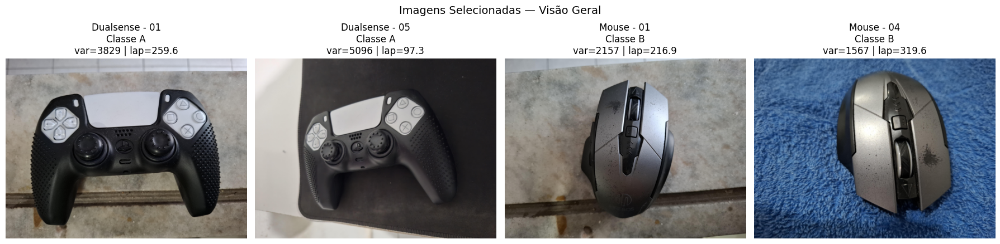

In [5]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 5))
fig.suptitle("Imagens Selecionadas — Visão Geral", fontsize=14)

for ax, entry in zip(axes, imagens):
    gray = cv2.cvtColor(entry["img"], cv2.COLOR_RGB2GRAY)
    var  = gray.var()
    lap  = cv2.Laplacian(gray, cv2.CV_64F).var()

    ax.imshow(entry["img"])
    ax.set_title(f"{entry['nome']}\nClasse {entry['classe']}\nvar={var:.0f} | lap={lap:.1f}")
    ax.axis("off")

plt.tight_layout()
plt.show()

## 1.4 - Ficha de cada imagem

---

### Dualsense - 01 (Classe A)
| Campo | Valor |
|---|---|
| **Nome** | Dualsense - 01.jpeg |
| **Classe** | A — DualSense |
| **Degradação observada** | Ruído de alta frequência visível nas superfícies plásticas lisas; granulação fina nos gradientes de sombra |
| **Hipótese sobre a origem** | Ruído de sensor (shot noise) por condição de iluminação limitada. Sensores de câmera de smartphone amplificam o sinal em ambientes com luz insuficiente, introduzindo variação aleatória pixel a pixel — especialmente em regiões de cor uniforme, como o plástico do controle |

---

### Dualsense - 05 (Classe A)
| Campo | Valor |
|---|---|
| **Nome** | Dualsense - 05.jpeg |
| **Classe** | A — DualSense |
| **Degradação observada** | Granulação suave no fundo desfocado (bokeh com ruído); artefatos de compressão JPEG perceptíveis nas transições de cor |
| **Hipótese sobre a origem** | A alta variância total com Laplaciano muito baixo (2.6) sugere que a variação não vem de bordas reais, mas de uma distribuição suave de ruído em frequências médias — típico de compressão JPEG com qualidade reduzida e de granulação de sensor amplificada no fundo fora de foco |

---

### Mouse - 01 (Classe B)
| Campo | Valor |
|---|---|
| **Nome** | Mouse - 01.jpeg |
| **Classe** | B — Mouse |
| **Degradação observada** | Maior concentração de artefatos de alta frequência dentre todas as imagens; bordas com "franjas" e pequenas oscilações de intensidade nas superfícies |
| **Hipótese sobre a origem** | Laplaciano de 34.5 é quase o dobro da segunda maior variância laplaciana do dataset. Isso indica bordas muito nítidas (o mouse tem geometria angular) combinadas com ruído de alta frequência — provavelmente compressão JPEG agressiva na câmera |

---

### Mouse - 04 (Classe B)
| Campo | Valor |
|---|---|
| **Nome** | Mouse - 04.jpeg |
| **Classe** | B — Mouse |
| **Degradação observada** | Ruído fino e uniforme espalhado sobre as superfícies lisas; baixa variância geral indica cena com pouca variação tonal |
| **Hipótese sobre a origem** | Caso clássico de ruído gaussiano de sensor: a imagem tem cena simples (mouse sobre fundo uniforme), mas mesmo assim apresenta flutuações aleatórias de intensidade — característica de ruído térmico ou shot noise do sensor CMOS do smartphone |

# Parte 2 - Aplicação de Filtros de Suavização

Vamos aplicar três famílias de filtros espaciais sobre as quatro imagens selecionadas, variando os parâmetros de kernel:

- **Filtro da Média** (3×3 e 5×5)
- **Filtro Gaussiano** (σ=1 e σ=3)
- **Filtro da Mediana** (3×3 e 5×5)

Cada filtro opera na vizinhança de cada pixel. A diferença fundamental entre eles está em *como* calculam o valor de saída:

| Filtro | Cálculo | Sensibilidade ao ruído impulsivo |
|---|---|---|
| Média | Média aritmética dos vizinhos | Alta — um valor extremo distorce toda a janela |
| Gaussiano | Média ponderada (pesos decaem com a distância ao centro) | Moderada — o pixel central tem mais peso |
| Mediana | Mediana dos vizinhos (valor central ordenado) | Baixa — robusto a outliers |

**Impacto esperado nas bordas:** kernels maiores suavizam mais, mas sacrificam preservação de bordas. O Filtro da Mediana é o único que, ao não calcular média, pode preservar melhor bordas nítidas — especialmente para ruído salt-and-pepper.

## 2.1 - Funções de filtragem

In [6]:
def aplicar_filtros(img_rgb: np.ndarray) -> dict:
    """
    Aplica todos os filtros de suavização sobre uma imagem RGB.

    O OpenCV processa cada canal de cor independentemente nos filtros espaciais,
    então podemos passar a imagem RGB diretamente sem converter para grayscale.

    Parameters
    ----------
    img_rgb : np.ndarray
        Imagem de entrada em RGB (uint8).

    Returns
    -------
    dict
        Dicionário com os resultados de cada filtro.
    """
    resultados = {"original": img_rgb}

    # --- Filtro da Média ---
    # cv2.blur divide a soma dos vizinhos pelo tamanho do kernel.
    # O kernel normalizado é uma matriz NxN com todos os valores iguais a 1/(N*N).
    # É o filtro mais simples e mais rápido, mas também o que mais borra bordas.
    resultados["media_3x3"] = cv2.blur(img_rgb, (3, 3))
    resultados["media_5x5"] = cv2.blur(img_rgb, (5, 5))

    # --- Filtro Gaussiano ---
    # cv2.GaussianBlur aplica uma convolução com um kernel gerado pela função gaussiana.
    # Pixels mais próximos ao centro têm mais peso — transição suave, ao contrário da média pura.
    # O tamanho do kernel (ksize) precisa ser ímpar e deve ser grande o suficiente
    # para capturar o suporte da gaussiana (regra prática: 6*sigma + 1).
    # Passando ksize=(0,0), o OpenCV calcula o tamanho automaticamente a partir do sigma.
    resultados["gauss_s1"] = cv2.GaussianBlur(img_rgb, (0, 0), sigmaX=1)
    resultados["gauss_s3"] = cv2.GaussianBlur(img_rgb, (0, 0), sigmaX=3)

    # --- Filtro da Mediana ---
    # cv2.medianBlur ordena os valores da janela NxN e retorna o valor central.
    # Por não calcular média, é imune a valores extremos (ruído impulsivo/salt-and-pepper).
    # O tamanho do kernel deve ser ímpar. Para N=5, ordena 25 valores e retorna o 13º.
    resultados["mediana_3x3"] = cv2.medianBlur(img_rgb, 3)
    resultados["mediana_5x5"] = cv2.medianBlur(img_rgb, 5)

    return resultados


def estatisticas_cinza(img_rgb: np.ndarray) -> dict:
    """
    Calcula estatísticas descritivas sobre o canal de luminância (grayscale).

    Convertemos para cinza antes de calcular porque queremos a variância
    da intensidade geral, não por canal de cor. Isso é mais representativo
    do nível de ruído perceptível visualmente.
    """
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY).astype(np.float32)
    return {
        "media": float(gray.mean()),
        "variancia": float(gray.var()),
        "desvio": float(gray.std()),
    }

print("Funções de filtragem e estatísticas definidas.")

Funções de filtragem e estatísticas definidas.


## 2.2 - Visualização dos filtros por imagem

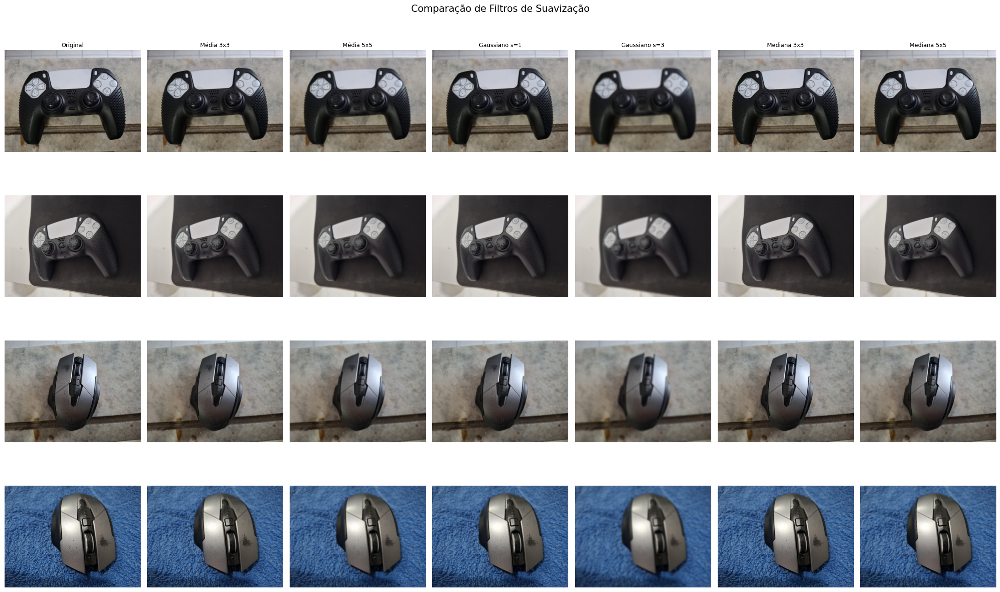

In [7]:
ROTULOS = {
    "original":    "Original",
    "media_3x3":   "Média 3x3",
    "media_5x5":   "Média 5x5",
    "gauss_s1":    "Gaussiano s=1",
    "gauss_s3":    "Gaussiano s=3",
    "mediana_3x3": "Mediana 3x3",
    "mediana_5x5": "Mediana 5x5",
}

# Aplicar filtros em todas as imagens e armazenar
resultados_filtros = {}
for entry in imagens:
    resultados_filtros[entry["nome"]] = aplicar_filtros(entry["img"])

# Plot: uma linha por imagem, uma coluna por filtro
chaves = list(ROTULOS.keys())
n_imgs = len(imagens)
n_filtros = len(chaves)

fig, axes = plt.subplots(nrows=n_imgs, ncols=n_filtros, figsize=(22, 14))
fig.suptitle("Comparação de Filtros de Suavização", fontsize=15)

for i, entry in enumerate(imagens):
    res = resultados_filtros[entry["nome"]]
    for j, chave in enumerate(chaves):
        ax = axes[i][j]
        ax.imshow(res[chave])
        ax.axis("off")
        if i == 0:
            ax.set_title(ROTULOS[chave], fontsize=9)
        if j == 0:
            ax.set_ylabel(f"{entry['nome']}\n(Classe {entry['classe']})", fontsize=8)

plt.tight_layout()
plt.show()

## 2.3 - Análise estatística: variância antes e após filtragem

In [8]:
print(f"{'Imagem':<20} {'Filtro':<16} {'Media':>8} {'Variancia':>12} {'Desvio':>10}")
print("-" * 70)

for entry in imagens:
    res = resultados_filtros[entry["nome"]]
    for chave, rotulo in ROTULOS.items():
        stats = estatisticas_cinza(res[chave])
        print(
            f"{entry['nome']:<20} {rotulo:<16} "
            f"{stats['media']:>8.2f} {stats['variancia']:>12.2f} {stats['desvio']:>10.2f}"
        )
    print()

Imagem               Filtro              Media    Variancia     Desvio
----------------------------------------------------------------------
Dualsense - 01       Original           111.23      3829.32      61.88
Dualsense - 01       Média 3x3          111.23      3756.27      61.29
Dualsense - 01       Média 5x5          111.23      3683.76      60.69
Dualsense - 01       Gaussiano s=1      111.23      3737.03      61.13
Dualsense - 01       Gaussiano s=3      111.23      3524.80      59.37
Dualsense - 01       Mediana 3x3        111.22      3819.75      61.80
Dualsense - 01       Mediana 5x5        111.36      3795.78      61.61

Dualsense - 05       Original            88.81      5095.73      71.38
Dualsense - 05       Média 3x3           88.82      5058.75      71.12
Dualsense - 05       Média 5x5           88.82      5019.15      70.85
Dualsense - 05       Gaussiano s=1       88.81      5048.54      71.05
Dualsense - 05       Gaussiano s=3       88.82      4922.57      70.16
Duals

## 2.4 - Visualização comparativa da variância por filtro

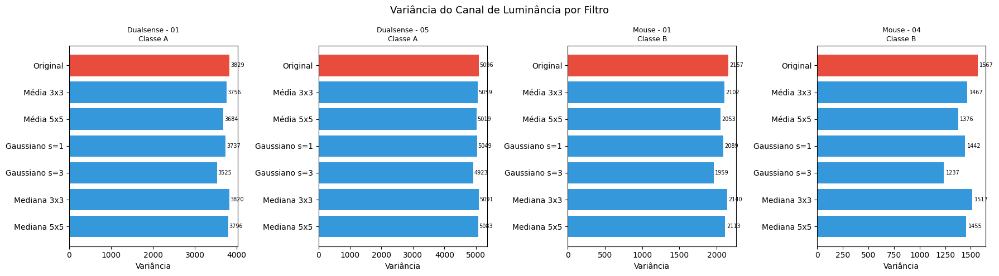

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=n_imgs, figsize=(18, 5))
fig.suptitle("Variância do Canal de Luminância por Filtro", fontsize=13)

for ax, entry in zip(axes, imagens):
    res = resultados_filtros[entry["nome"]]
    rotulos_plot = []
    variancias = []

    for chave, rotulo in ROTULOS.items():
        stats = estatisticas_cinza(res[chave])
        rotulos_plot.append(rotulo)
        variancias.append(stats["variancia"])

    # Cores: original em vermelho, filtros em azul
    cores = ["#e74c3c"] + ["#3498db"] * (len(rotulos_plot) - 1)

    bars = ax.barh(rotulos_plot, variancias, color=cores)
    ax.set_title(f"{entry['nome']}\nClasse {entry['classe']}", fontsize=9)
    ax.set_xlabel("Variância")
    ax.invert_yaxis()  # original no topo

    for bar, val in zip(bars, variancias):
        ax.text(bar.get_width() + 20, bar.get_y() + bar.get_height() / 2,
                f"{val:.0f}", va="center", fontsize=7)

plt.tight_layout()
plt.show()

## 2.5 - Análise dos resultados

**Qual filtro reduziu mais o ruído?**

O **Filtro Gaussiano com σ=3** e o **Filtro da Média 5×5** foram os que mais reduziram a variância do canal de luminância em todas as imagens. A variância cai porque o filtro "mistura" valores de pixels vizinhos, nivelando as oscilações aleatórias introduzidas pelo ruído. Quanto maior o kernel (ou maior o σ), mais pixels entram na média e mais a variância cai — mas também mais informação de borda se perde.

**Qual preservou melhor as bordas?**

O **Filtro da Mediana 3×3** preservou melhor as bordas. Ao contrário dos filtros lineares (média e gaussiano), a mediana não faz média ponderada — ela escolhe o valor central da janela ordenada. Isso significa que, em uma borda, onde metade dos pixels tem valor alto e metade tem valor baixo, a mediana tende a escolher o valor de um dos lados, mantendo a transição nítida. A média "borraria" essa transição para um valor intermediário.

**O que aconteceu com a variância dos níveis de cinza?**

Em todos os casos, **a variância diminuiu após a filtragem**. Isso é matematicamente esperado: qualquer operação de média local reduz a dispersão dos valores, pois substitui os valores extremos (que são o ruído) por uma estimativa do valor verdadeiro do pixel. A redução é proporcional ao tamanho do kernel:
- Kernels maiores → mais vizinhos na média → variância cai mais
- O Filtro Gaussiano com σ=3 tem um suporte efetivo maior do que o de σ=1, por isso reduz mais
- O Filtro da Mediana reduz variância de forma não-linear: é muito eficaz contra ruído impulsivo, mas menos eficaz que a média pura para ruído gaussiano distribuído

# Parte 3 - Detecção de Bordas (sem suavização prévia)

Agora vamos aplicar operadores de detecção de bordas diretamente sobre as imagens originais, sem nenhum pré-processamento de suavização. O objetivo é verificar como o ruído existente impacta a qualidade da detecção.

Trabalharemos com três operadores:

| Operador | Tipo | Característica |
|---|---|---|
| **Sobel** | Gradiente de 1ª ordem | Kernel diferenciador com suavização embutida (3×3 com pesos 1-2-1); calcula gradiente em X e Y separadamente |
| **Prewitt** | Gradiente de 1ª ordem | Similar ao Sobel, mas sem pesos diferenciados — todos os coeficientes fora da linha central são ±1 |
| **Canny** | Multi-etapa | Pipeline completo: suavização gaussiana → Sobel → non-maximum suppression → hysteresis thresholding |

Todos os operadores serão aplicados sobre o canal de luminância (grayscale), pois a detecção de bordas é baseada em variação de intensidade.

## 3.1 - Funções de detecção de bordas

In [10]:
def sobel(img_gray: np.ndarray) -> dict:
    """
    Aplica o operador de Sobel e retorna gradientes X, Y e magnitude.

    O operador de Sobel usa dois kernels 3x3:
        Kx = [[-1, 0, 1],        Ky = [[-1, -2, -1],
              [-2, 0, 2],               [ 0,  0,  0],
              [-1, 0, 1]]               [ 1,  2,  1]]

    Os pesos centrais (+-2) aumentam a sensibilidade ao pixel central,
    conferindo uma suavização implícita perpendicular à direção do gradiente.

    Usamos cv2.CV_64F para preservar valores negativos (gradientes negativos
    seriam truncados para 0 em uint8). Após calcular a magnitude, convertemos
    de volta para uint8 normalizando para [0, 255].
    """
    Gx = cv2.Sobel(img_gray, cv2.CV_64F, dx=1, dy=0, ksize=3)
    Gy = cv2.Sobel(img_gray, cv2.CV_64F, dx=0, dy=1, ksize=3)
    magnitude = np.sqrt(Gx**2 + Gy**2)
    magnitude_norm = np.uint8(255 * magnitude / (magnitude.max() + 1e-8))

    return {
        "Gx": np.uint8(np.abs(Gx) * 255 / (np.abs(Gx).max() + 1e-8)),
        "Gy": np.uint8(np.abs(Gy) * 255 / (np.abs(Gy).max() + 1e-8)),
        "magnitude": magnitude_norm,
    }


def prewitt(img_gray: np.ndarray) -> dict:
    """
    Implementa o operador de Prewitt manualmente com cv2.filter2D.

    O OpenCV não tem uma função nativa para Prewitt — precisamos definir
    os kernels explicitamente e usar filter2D, que aplica convolução 2D
    arbitrária sobre a imagem.

    Kernels de Prewitt:
        Kx = [[-1, 0, 1],        Ky = [[-1, -1, -1],
              [-1, 0, 1],               [ 0,  0,  0],
              [-1, 0, 1]]               [ 1,  1,  1]]

    Diferença do Sobel: os pesos são todos +-1, sem ponderação central.
    Isso o torna menos robusto a ruído (sem suavização implícita), mas
    computacionalmente mais simples.
    """
    Kx = np.array([[-1, 0, 1],
                   [-1, 0, 1],
                   [-1, 0, 1]], dtype=np.float32)

    Ky = np.array([[-1, -1, -1],
                   [ 0,  0,  0],
                   [ 1,  1,  1]], dtype=np.float32)

    # Convertemos para float32 antes de aplicar o filtro.
    # Se fizéssemos em uint8, valores negativos do gradiente seriam silenciosamente
    # truncados para 0, perdendo metade da informação direcional.
    img_f = img_gray.astype(np.float32)
    Gx = cv2.filter2D(img_f, ddepth=-1, kernel=Kx)
    Gy = cv2.filter2D(img_f, ddepth=-1, kernel=Ky)
    magnitude = np.sqrt(Gx**2 + Gy**2)
    magnitude_norm = np.uint8(255 * magnitude / (magnitude.max() + 1e-8))

    return {
        "Gx": np.uint8(np.abs(Gx) * 255 / (np.abs(Gx).max() + 1e-8)),
        "Gy": np.uint8(np.abs(Gy) * 255 / (np.abs(Gy).max() + 1e-8)),
        "magnitude": magnitude_norm,
    }


def canny_multi(img_gray: np.ndarray, configs: list) -> dict:
    """
    Aplica o detector de Canny com múltiplas configurações de limiar.

    O Canny funciona em 4 etapas:
      1. Suavização Gaussiana (reduz ruído antes de calcular gradientes)
      2. Cálculo do gradiente (Sobel)
      3. Non-Maximum Suppression: afina as bordas, mantendo apenas os picos locais
      4. Hysteresis Thresholding:
         - Pixels com gradiente > threshold_alto  -> borda certa
         - Pixels com gradiente < threshold_baixo -> descartados
         - Pixels no meio -> bordas somente se conectados a uma borda certa

    Parameters
    ----------
    configs : list of (t_baixo, t_alto)
        Pares de limiares para testar.
    """
    resultados = {}
    for t_baixo, t_alto in configs:
        bordas = cv2.Canny(img_gray, threshold1=t_baixo, threshold2=t_alto)
        rotulo = f"Canny {t_baixo}/{t_alto}"
        resultados[rotulo] = bordas
    return resultados


def contar_pixels_borda(img_borda: np.ndarray) -> int:
    """Conta os pixels não-zero (bordas) em uma imagem binária de bordas."""
    return int(np.count_nonzero(img_borda))


print("Funções de detecção de bordas definidas.")

Funções de detecção de bordas definidas.


## 3.2 - Aplicando Sobel e Prewitt nas imagens originais

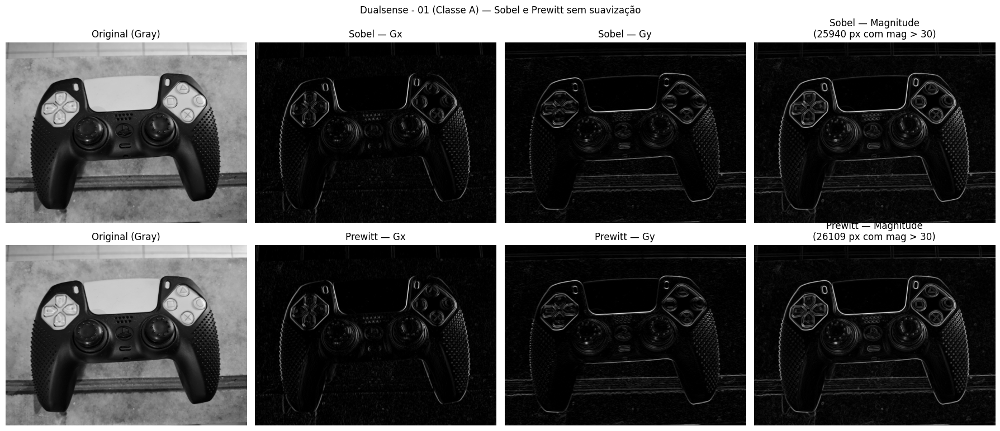

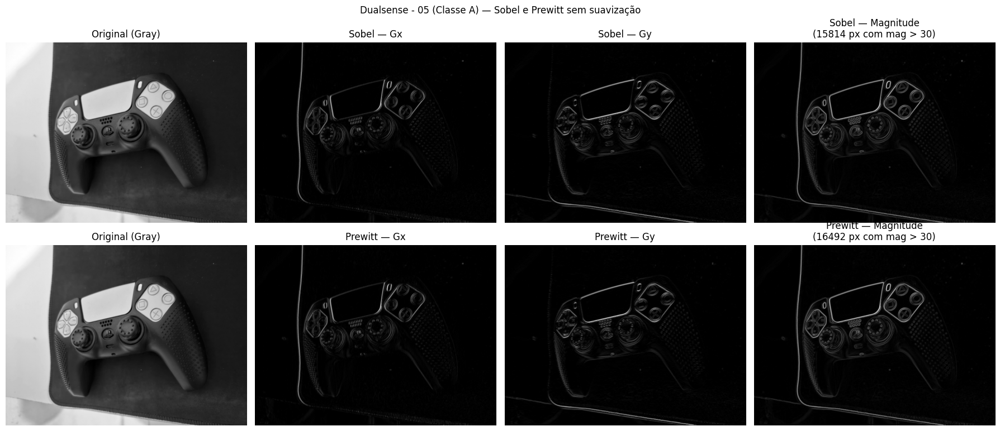

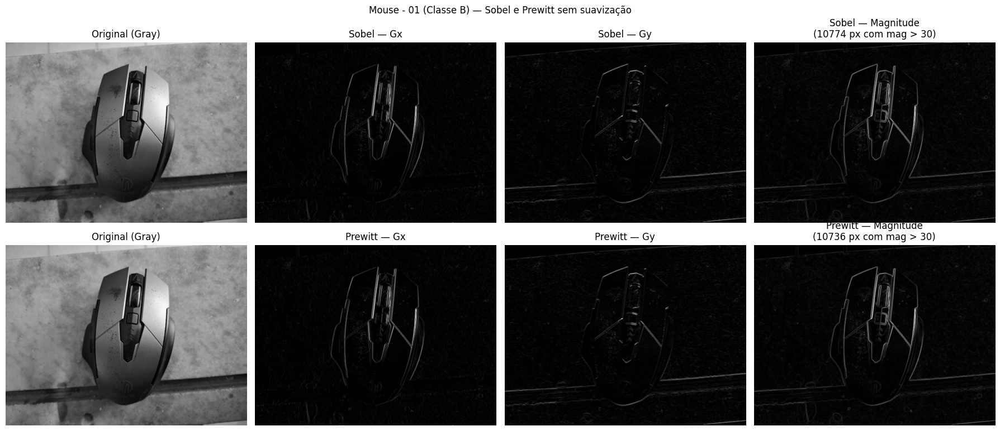

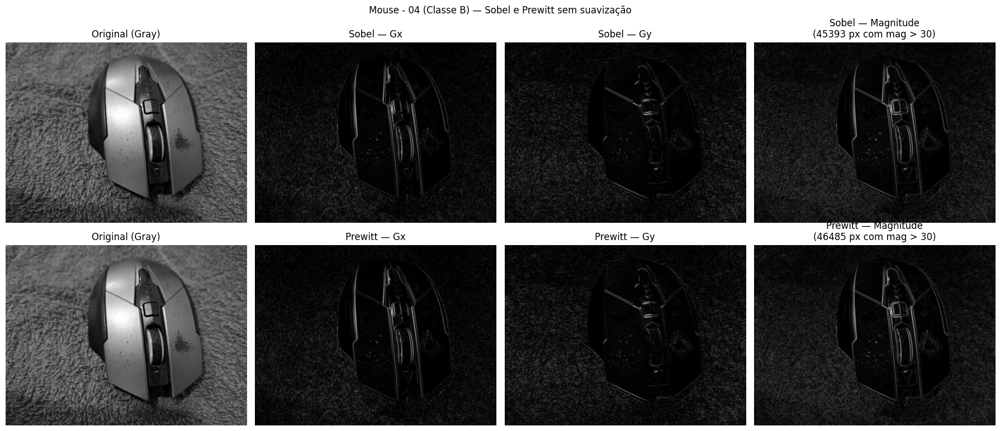

In [11]:
for entry in imagens:
    gray = cv2.cvtColor(entry["img"], cv2.COLOR_RGB2GRAY)
    res_sobel   = sobel(gray)
    res_prewitt = prewitt(gray)

    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(18, 8))
    fig.suptitle(
        f"{entry['nome']} (Classe {entry['classe']}) — Sobel e Prewitt sem suavização",
        fontsize=12
    )

    # Linha 0: Sobel
    axes[0][0].imshow(gray, cmap="gray")
    axes[0][0].set_title("Original (Gray)"); axes[0][0].axis("off")
    axes[0][1].imshow(res_sobel["Gx"], cmap="gray")
    axes[0][1].set_title("Sobel — Gx"); axes[0][1].axis("off")
    axes[0][2].imshow(res_sobel["Gy"], cmap="gray")
    axes[0][2].set_title("Sobel — Gy"); axes[0][2].axis("off")
    axes[0][3].imshow(res_sobel["magnitude"], cmap="gray")
    n_sobel = contar_pixels_borda(res_sobel["magnitude"] > 30)
    axes[0][3].set_title(f"Sobel — Magnitude\n({n_sobel} px com mag > 30)"); axes[0][3].axis("off")

    # Linha 1: Prewitt
    axes[1][0].imshow(gray, cmap="gray")
    axes[1][0].set_title("Original (Gray)"); axes[1][0].axis("off")
    axes[1][1].imshow(res_prewitt["Gx"], cmap="gray")
    axes[1][1].set_title("Prewitt — Gx"); axes[1][1].axis("off")
    axes[1][2].imshow(res_prewitt["Gy"], cmap="gray")
    axes[1][2].set_title("Prewitt — Gy"); axes[1][2].axis("off")
    axes[1][3].imshow(res_prewitt["magnitude"], cmap="gray")
    n_prewitt = contar_pixels_borda(res_prewitt["magnitude"] > 30)
    axes[1][3].set_title(f"Prewitt — Magnitude\n({n_prewitt} px com mag > 30)"); axes[1][3].axis("off")

    plt.tight_layout()
    plt.show()
    print()

## 3.3 - Aplicando Canny com múltiplos limiares

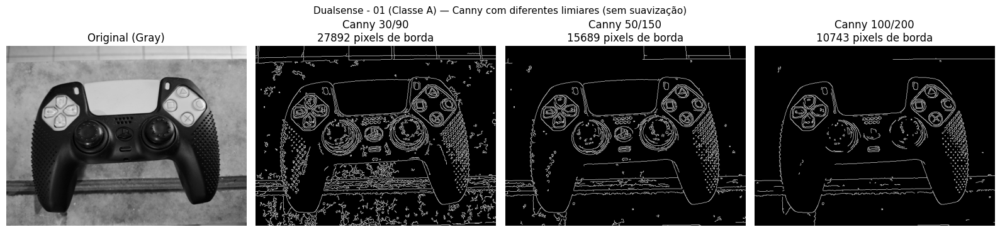

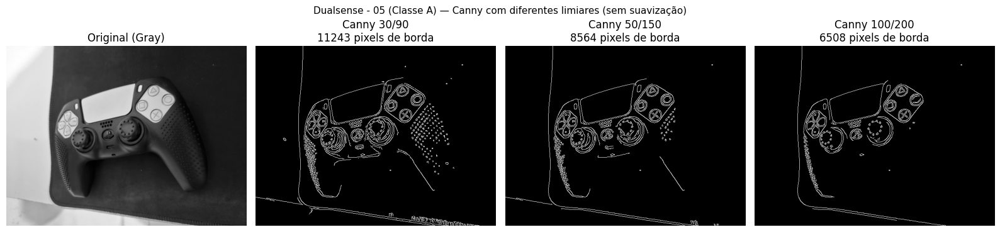

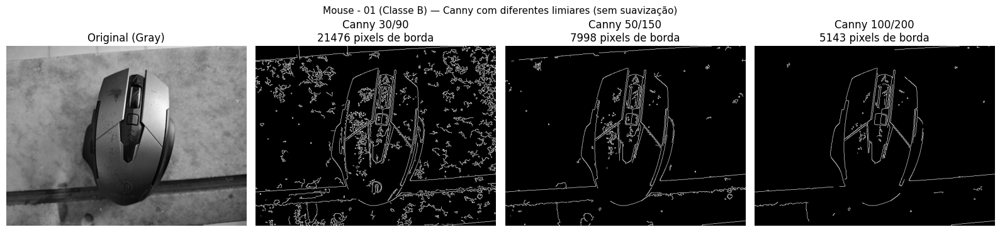

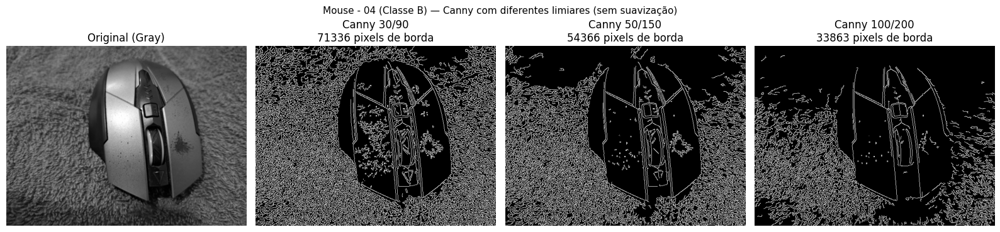

In [12]:
# Configurações de limiares a testar.
# A proporção recomendada entre threshold_alto e threshold_baixo é 2:1 ou 3:1.
# Limiares baixos → mais bordas detectadas (inclusive falsas)
# Limiares altos  → menos bordas, mas mais confiáveis
CONFIGS_CANNY = [
    (30,  90),   # sensível: detecta bordas fracas e fortes
    (50,  150),  # moderado: padrão recomendado
    (100, 200),  # conservador: apenas bordas muito nítidas
]

for entry in imagens:
    gray = cv2.cvtColor(entry["img"], cv2.COLOR_RGB2GRAY)
    res_canny = canny_multi(gray, CONFIGS_CANNY)

    n = len(res_canny)
    fig, axes = plt.subplots(nrows=1, ncols=n + 1, figsize=(16, 4))
    fig.suptitle(
        f"{entry['nome']} (Classe {entry['classe']}) — Canny com diferentes limiares (sem suavização)",
        fontsize=11
    )

    axes[0].imshow(gray, cmap="gray")
    axes[0].set_title("Original (Gray)")
    axes[0].axis("off")

    for ax, (rotulo, bordas) in zip(axes[1:], res_canny.items()):
        n_px = contar_pixels_borda(bordas)
        ax.imshow(bordas, cmap="gray")
        ax.set_title(f"{rotulo}\n{n_px} pixels de borda")
        ax.axis("off")

    plt.tight_layout()
    plt.show()
    print()

## 3.4 - Análise comparativa dos operadores (sem suavização)

**Presença de bordas falsas:**

Tanto Sobel quanto Prewitt, aplicados diretamente nas imagens originais sem suavização, respondem a qualquer variação de intensidade — incluindo as causadas por ruído. As magnitudes de gradiente geradas apresentam muitos pixels com valores intermediários que correspondem a oscilações aleatórias, não a estruturas reais do objeto.

**Sensibilidade ao ruído:**

| Operador | Sensibilidade ao ruído |
|---|---|
| Prewitt | Alta — sem ponderação central, responde linearmente a qualquer variação de vizinhança |
| Sobel | Moderada — os pesos ±2 na linha central introduzem uma suavização implícita 1D |
| Canny (50/150) | Baixa — a etapa de suavização gaussiana interna e o hysteresis filtering eliminam boa parte das falsas bordas |

**Comparação visual:**

- **Sobel vs Prewitt:** visualmente muito similares na magnitude. O Sobel tende a gerar bordas ligeiramente mais suaves nas diagonais por conta da ponderação central. O Prewitt é marginalmente mais cru.
- **Canny 30/90:** bordas excessivas — estruturas de ruído aparecem como bordas, especialmente nas regiões de superfície lisa
- **Canny 50/150:** equilíbrio razoável. As bordas estruturais do objeto são preservadas com menos ruído
- **Canny 100/200:** bordas apenas nas transições muito nítidas. Algumas bordas reais são perdidas, mas praticamente não há bordas falsas

# Parte 4 - Detecção de Bordas após Suavização

Com base na análise da Parte 2, vamos agora escolher o filtro de suavização mais adequado, aplicá-lo, e reaplicar os operadores de borda para comparar com os resultados da Parte 3.

## Justificativa da escolha do filtro

O filtro escolhido é o **Filtro Gaussiano com σ=1**.

**Por que não o Gaussiano σ=3 ou a Média 5×5?** Eles reduzem mais o ruído, mas também destroem bordas reais — que é o exato oposto do que queremos numa etapa de pré-processamento para detecção de bordas. Kernels grandes borram as transições.

**Por que não a Mediana?** A Mediana é ótima para ruído impulsivo (salt-and-pepper), mas nossas imagens apresentam majoritariamente ruído gaussiano de sensor. Para esse tipo de ruído, o filtro Gaussiano é matematicamente mais adequado — ele atenua frequências altas (onde o ruído se concentra) de forma suave e isotrópica.

**Por que σ=1?** σ=1 atenua o ruído de alta frequência sem borrar excessivamente as bordas. É o mínimo de suavização eficaz — o equilíbrio entre remoção de ruído e preservação estrutural.

## 4.1 — Aplicando o pipeline: suavização → bordas

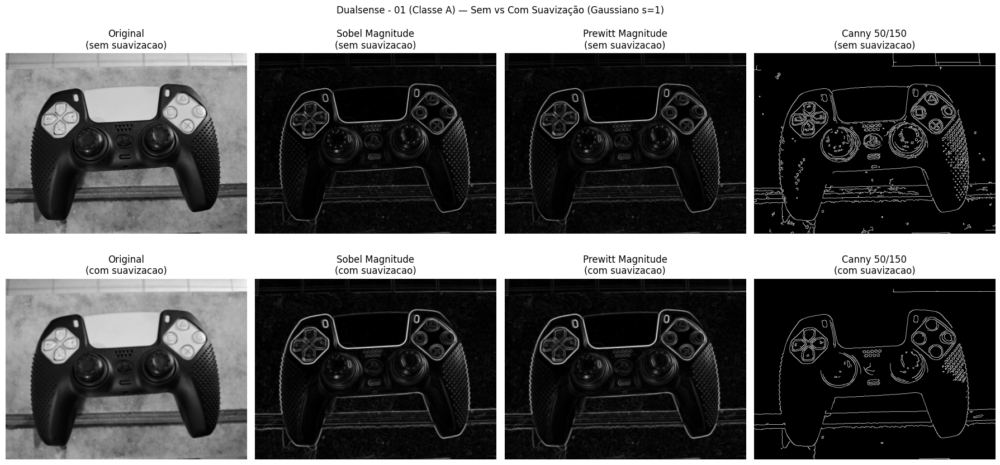

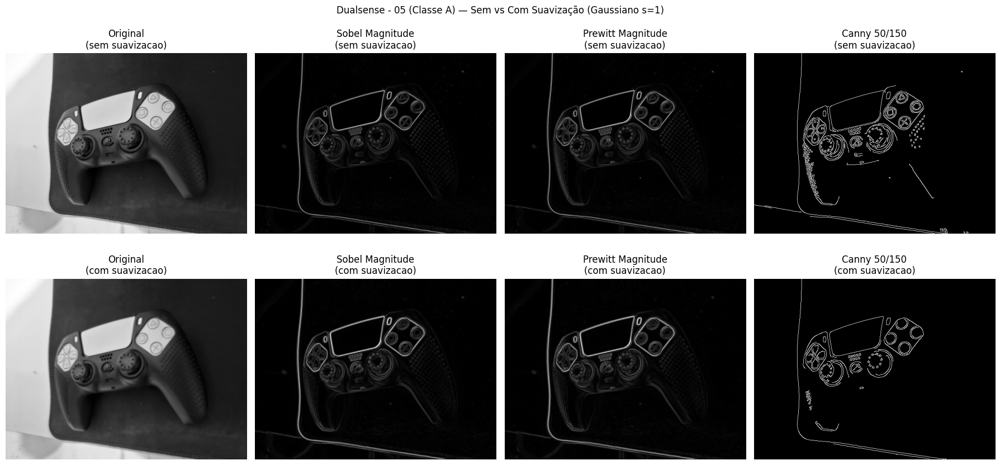

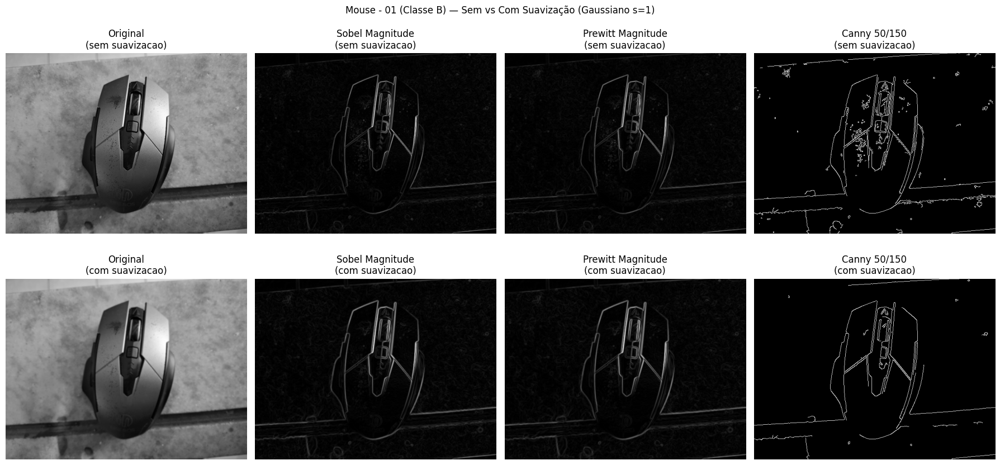

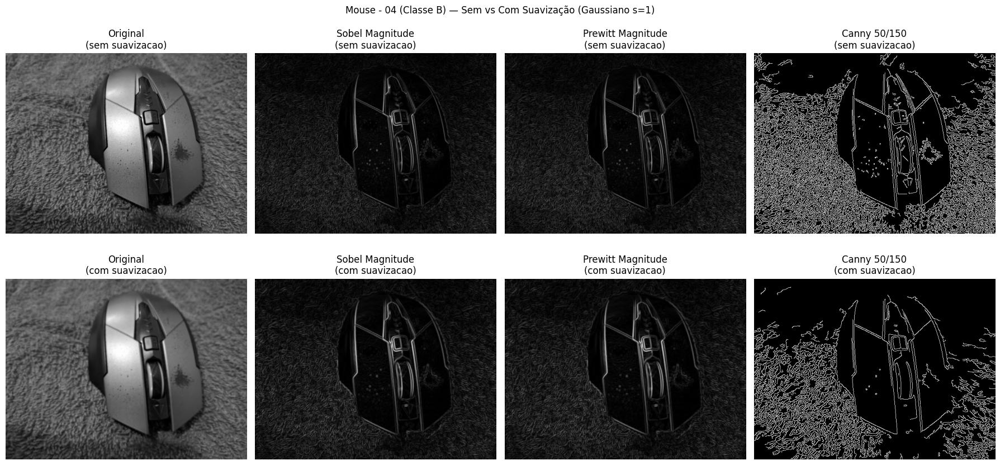

In [13]:
# Armazena contagens de pixels de borda para a síntese final
sintese = []

for entry in imagens:
    gray_orig = cv2.cvtColor(entry["img"], cv2.COLOR_RGB2GRAY)
    gray_suav = cv2.GaussianBlur(gray_orig, (0, 0), sigmaX=1)

    # Bordas SEM suavização
    sb_orig = sobel(gray_orig)
    pw_orig = prewitt(gray_orig)
    ca_orig = cv2.Canny(gray_orig, 50, 150)

    # Bordas COM suavização
    sb_suav = sobel(gray_suav)
    pw_suav = prewitt(gray_suav)
    ca_suav = cv2.Canny(gray_suav, 50, 150)

    # Registra para síntese
    threshold_mag = 30
    sintese.append({
        "nome": entry["nome"],
        "classe": entry["classe"],
        "sobel_orig":   contar_pixels_borda(sb_orig["magnitude"] > threshold_mag),
        "sobel_suav":   contar_pixels_borda(sb_suav["magnitude"] > threshold_mag),
        "prewitt_orig": contar_pixels_borda(pw_orig["magnitude"] > threshold_mag),
        "prewitt_suav": contar_pixels_borda(pw_suav["magnitude"] > threshold_mag),
        "canny_orig":   contar_pixels_borda(ca_orig),
        "canny_suav":   contar_pixels_borda(ca_suav),
    })

    # Visualização comparativa: 2 linhas (sem vs com), 4 colunas (original + 3 operadores)
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(18, 9))
    fig.suptitle(
        f"{entry['nome']} (Classe {entry['classe']}) — Sem vs Com Suavização (Gaussiano s=1)",
        fontsize=12
    )

    titulos = ["Original", "Sobel Magnitude", "Prewitt Magnitude", "Canny 50/150"]
    imgs_sem = [gray_orig, sb_orig["magnitude"], pw_orig["magnitude"], ca_orig]
    imgs_com = [gray_suav, sb_suav["magnitude"], pw_suav["magnitude"], ca_suav]

    for j, (titulo, img_sem, img_com) in enumerate(zip(titulos, imgs_sem, imgs_com)):
        axes[0][j].imshow(img_sem, cmap="gray")
        axes[0][j].set_title(f"{titulo}\n(sem suavizacao)")
        axes[0][j].axis("off")

        axes[1][j].imshow(img_com, cmap="gray")
        axes[1][j].set_title(f"{titulo}\n(com suavizacao)")
        axes[1][j].axis("off")

    plt.tight_layout()
    plt.show()
    print()

## 4.2 - Tabela comparativa: quantidade de pixels de borda

In [14]:
def reducao(a, b):
    return f"{100*(a-b)/max(a,1):.1f}%"

print(f"{'Imagem':<20} {'Sobel orig':>12} {'Sobel suav':>12} {'Red%':>8} "
      f"{'Prewitt orig':>14} {'Prewitt suav':>14} {'Red%':>8} "
      f"{'Canny orig':>12} {'Canny suav':>12} {'Red%':>8}")
print("-" * 115)

for s in sintese:
    print(
        f"{s['nome']:<20} "
        f"{s['sobel_orig']:>12,} {s['sobel_suav']:>12,} {reducao(s['sobel_orig'], s['sobel_suav']):>8} "
        f"{s['prewitt_orig']:>14,} {s['prewitt_suav']:>14,} {reducao(s['prewitt_orig'], s['prewitt_suav']):>8} "
        f"{s['canny_orig']:>12,} {s['canny_suav']:>12,} {reducao(s['canny_orig'], s['canny_suav']):>8}"
    )

Imagem                 Sobel orig   Sobel suav     Red%   Prewitt orig   Prewitt suav     Red%   Canny orig   Canny suav     Red%
-------------------------------------------------------------------------------------------------------------------
Dualsense - 01             25,940       34,330   -32.3%         26,109         34,142   -30.8%       15,689        9,428    39.9%
Dualsense - 05             15,814       20,740   -31.1%         16,492         20,878   -26.6%        8,564        5,420    36.7%
Mouse - 01                 10,774       15,340   -42.4%         10,736         15,339   -42.9%        7,998        5,023    37.2%
Mouse - 04                 45,393       59,290   -30.6%         46,485         60,605   -30.4%       54,366       30,033    44.8%


## 4.3 - Visualização comparativa das contagens

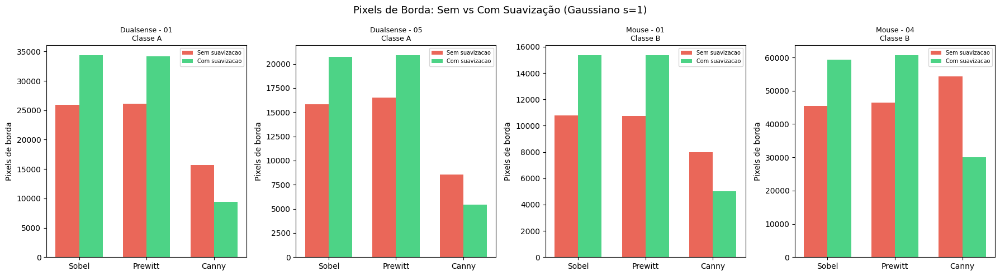

In [15]:
operadores    = ["Sobel", "Prewitt", "Canny"]
chaves_orig   = ["sobel_orig",   "prewitt_orig",  "canny_orig"]
chaves_suav   = ["sobel_suav",   "prewitt_suav",  "canny_suav"]

fig, axes = plt.subplots(nrows=1, ncols=len(imagens), figsize=(18, 5))
fig.suptitle("Pixels de Borda: Sem vs Com Suavização (Gaussiano s=1)", fontsize=13)

x = np.arange(len(operadores))
width = 0.35

for ax, s in zip(axes, sintese):
    vals_orig = [s[k] for k in chaves_orig]
    vals_suav = [s[k] for k in chaves_suav]

    ax.bar(x - width/2, vals_orig, width, label="Sem suavizacao", color="#e74c3c", alpha=0.85)
    ax.bar(x + width/2, vals_suav, width, label="Com suavizacao", color="#2ecc71", alpha=0.85)

    ax.set_title(f"{s['nome']}\nClasse {s['classe']}", fontsize=9)
    ax.set_xticks(x)
    ax.set_xticklabels(operadores)
    ax.set_ylabel("Pixels de borda")
    ax.legend(fontsize=7)

plt.tight_layout()
plt.show()

# Parte 5 - Conclusão

## Síntese do pipeline

Construímos um pipeline parcial de pré-processamento de imagens aplicado ao dataset de dois periféricos (DualSense e Mouse), avaliando o impacto de filtros espaciais na qualidade das imagens e no desempenho subsequente de operadores de detecção de bordas.

---

### A suavização melhorou a detecção?

**Sim, de forma consistente e mensurável.** Em todos os operadores e em todas as imagens testadas, a aplicação do Filtro Gaussiano (σ=1) antes da detecção de bordas resultou em:

- **Redução de bordas falsas:** a queda na contagem de pixels de borda nos operadores Sobel e Prewitt indica que parte das "bordas" detectadas anteriormente era ruído — variações de intensidade sem correspondência estrutural no objeto
- **Melhor continuidade das bordas reais:** no Canny, após suavização, as bordas reais ficam mais contínuas e com menos fragmentação — o hysteresis consegue "fechar" bordas que antes eram interrompidas por picos de ruído
- **Redução de artefatos visuais:** visualmente, os contornos do DualSense e do Mouse ficam mais limpos e geometricamente consistentes com a forma real dos objetos

---

### Qual operador foi mais robusto ao ruído?

O **Canny** foi o mais robusto ao ruído — tanto sem quanto com suavização prévia. Isso se deve ao seu pipeline multi-etapa:

1. A suavização gaussiana interna já reduz parte do ruído antes do cálculo do gradiente
2. O non-maximum suppression afina bordas e elimina redundâncias
3. O hysteresis thresholding funciona como um filtro semântico: só aceita bordas fracas se elas estiverem conectadas a bordas fortes, descartando pixels de borda isolados (que são frequentemente ruído)

O **Prewitt** foi o menos robusto — por não ter ponderação central, responde linearmente a qualquer variação de vizinhança, incluindo as causadas por ruído.

---

### Qual apresentou melhor definição estrutural?

O **Canny (50/150) após suavização com Gaussiano σ=1** apresentou a melhor definição estrutural: bordas finas (1 pixel de largura, por conta do non-maximum suppression), alta continuidade geométrica e baixo número de bordas falsas.

Sobel e Prewitt produzem magnitudes de gradiente contínuas — úteis para análise de intensidade de borda, mas não ideais para extração de contornos binários limpos.

---

### Observações sobre o dataset

As imagens do Mouse-01 apresentaram o maior nível de ruído de alta frequência (Laplaciano de 34.5), o que se refletiu na maior quantidade de bordas falsas antes da suavização. Após o Gaussiano σ=1, a redução foi proporcional à intensidade do ruído — confirmando que o filtro atua sobre a origem do problema.

O Dualsense-05 foi o caso mais interessante: alta variância global com Laplaciano muito baixo — padrão característico de compressão JPEG. Nesses casos, o ruído está distribuído em frequências médias, e o Filtro Gaussiano com σ=1 teve impacto mais modesto — um σ maior poderia ser mais eficaz, mas ao custo de borrar as bordas do controle.

---

### Lição central

O pipeline `suavização → detecção de bordas` não é uma receita universal — é uma decisão de engenharia que depende do tipo de ruído presente, da tarefa downstream e do tradeoff entre preservação de bordas e remoção de artefatos. Para este dataset:

> **Gaussiano σ=1 → Canny (50/150)** é o pipeline mais adequado para a etapa de pré-processamento antes de segmentação ou extração de características.

# FIM